In this notebook, we will explore the data available for [Open Climate Fix](https://openclimatefix.org/) photovoltaic mapping project.

In [2]:
import rasterio
from rasterio.plot import show
import PIL
import glob
import pylab as plt
%matplotlib inline
import pandas as pd
import numpy as np
from skimage import measure


The imagery data is divided into two, Exeter and Nottingham. Focusing on Exeter, there are 3 areas: `GeoTiff_03`, `GeoTiff_04`, and `GeoTiff_05`. Each folder contains imagery, with filenames consisiting of Ordnance Survey Grid reference. The corresponding solar rasters have the same filename as the imagery.

In [3]:
ls -R /Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/


BlueSky_OCF_Exeter.zip
BlueSky_OCF_Nottingham.zip
Exeter/
Nottingham/
groundtruth_draft_2020-07-06_BlueSky_OCF_Exeter_rasterised.zip

/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw//Exeter:
GeoTiff_03/       Metadata/         polygons/         solar-rasters_v2/
GeoTiff_04/       cutouts/          polygons.zip      solar-rasters_v3/
GeoTiff_05/       deepnet_cutouts/  solar-rasters/

/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw//Exeter/GeoTiff_03:
SS6605.tfw  SS7207.tfw  SS7620.tfw  SS8013.tfw  SS8315.tfw  SS8616.tfw
SS6605.tif  SS7207.tif  SS7620.tif  SS8013.tif  SS8315.tif  SS8616.tif
SS6606.tfw  SS7208.tfw  SS7621.tfw  SS8014.tfw  SS8316.tfw  SS8617.tfw
SS6606.tif  SS7208.tif  SS7621.tif  SS8014.tif  SS8316.tif  SS8617.tif
SS6702.tfw  SS7209.tfw  SS7622.tfw  SS8015.tfw  SS8317.tfw  SS8618.tfw
SS6702.tif  SS7209.tif  SS7622.tif  SS8015.tif  SS8317.tif  SS8618.tif
SS6703.tfw  SS7210.tfw  SS7700.tfw  SS8016.tfw  SS8318.tfw  SS8619.tfw
SS6703.tif  SS7210.tif  SS7700.tif  SS8016.tif  SS

SS9100.tfw  SS9710.tfw  ST0222.tfw  ST0807.tfw  ST1406.tfw  ST2205.tfw
SS9100.tif  SS9710.tif  ST0222.tif  ST0807.tif  ST1406.tif  ST2205.tif
SS9101.tfw  SS9711.tfw  ST0223.tfw  ST0808.tfw  ST1407.tfw  ST2206.tfw
SS9101.tif  SS9711.tif  ST0223.tif  ST0808.tif  ST1407.tif  ST2206.tif
SS9102.tfw  SS9712.tfw  ST0224.tfw  ST0809.tfw  ST1408.tfw  ST2207.tfw
SS9102.tif  SS9712.tif  ST0224.tif  ST0809.tif  ST1408.tif  ST2207.tif
SS9103.tfw  SS9713.tfw  ST0225.tfw  ST0810.tfw  ST1409.tfw  ST2208.tfw
SS9103.tif  SS9713.tif  ST0225.tif  ST0810.tif  ST1409.tif  ST2208.tif
SS9104.tfw  SS9714.tfw  ST0300.tfw  ST0811.tfw  ST1410.tfw  ST2209.tfw
SS9104.tif  SS9714.tif  ST0300.tif  ST0811.tif  ST1410.tif  ST2209.tif
SS9105.tfw  SS9715.tfw  ST0301.tfw  ST0812.tfw  ST1411.tfw  ST2300.tfw
SS9105.tif  SS9715.tif  ST0301.tif  ST0812.tif  ST1411.tif  ST2300.tif
SS9106.tfw  SS9716.tfw  ST0302.tfw  ST0813.tfw  ST1412.tfw  ST2301.tfw
SS9106.tif  SS9716.tif  ST0302.tif  ST0813.tif  ST1412.tif  ST2301.tif
SS9107

SX8086.tfw  SX8890.tfw  SX9490.tfw  SY0090.tfw  SY0783.tfw  SY1599.tfw
SX8086.tif  SX8890.tif  SX9490.tif  SY0090.tif  SY0783.tif  SY1599.tif
SX8087.tfw  SX8891.tfw  SX9491.tfw  SY0091.tfw  SY0784.tfw  SY1687.tfw
SX8087.tif  SX8891.tif  SX9491.tif  SY0091.tif  SY0784.tif  SY1687.tif
SX8088.tfw  SX8892.tfw  SX9492.tfw  SY0092.tfw  SY0785.tfw  SY1688.tfw
SX8088.tif  SX8892.tif  SX9492.tif  SY0092.tif  SY0785.tif  SY1688.tif
SX8089.tfw  SX8893.tfw  SX9493.tfw  SY0093.tfw  SY0786.tfw  SY1689.tfw
SX8089.tif  SX8893.tif  SX9493.tif  SY0093.tif  SY0786.tif  SY1689.tif
SX8090.tfw  SX8894.tfw  SX9494.tfw  SY0094.tfw  SY0787.tfw  SY1690.tfw
SX8090.tif  SX8894.tif  SX9494.tif  SY0094.tif  SY0787.tif  SY1690.tif
SX8091.tfw  SX8895.tfw  SX9495.tfw  SY0095.tfw  SY0788.tfw  SY1691.tfw
SX8091.tif  SX8895.tif  SX9495.tif  SY0095.tif  SY0788.tif  SY1691.tif
SX8092.tfw  SX8896.tfw  SX9496.tfw  SY0096.tfw  SY0789.tfw  SY1692.tfw
SX8092.tif  SX8896.tif  SX9496.tif  SY0096.tif  SY0789.tif  SY1692.tif
SX8093

SS6605.xml  SS8306.xml  SS9821.xml  ST1319.xml  SX8595.xml  SY0291.xml
SS6606.xml  SS8307.xml  SS9822.xml  ST1320.xml  SX8596.xml  SY0292.xml
SS6702.xml  SS8308.xml  SS9823.xml  ST1400.xml  SX8597.xml  SY0293.xml
SS6703.xml  SS8309.xml  SS9900.xml  ST1401.xml  SX8598.xml  SY0294.xml
SS6704.xml  SS8310.xml  SS9901.xml  ST1402.xml  SX8599.xml  SY0295.xml
SS6705.xml  SS8311.xml  SS9902.xml  ST1403.xml  SX8683.xml  SY0296.xml
SS6706.xml  SS8312.xml  SS9903.xml  ST1404.xml  SX8684.xml  SY0297.xml
SS6707.xml  SS8313.xml  SS9904.xml  ST1405.xml  SX8685.xml  SY0298.xml
SS6708.xml  SS8314.xml  SS9905.xml  ST1406.xml  SX8686.xml  SY0299.xml
SS6709.xml  SS8315.xml  SS9906.xml  ST1407.xml  SX8687.xml  SY0379.xml
SS6710.xml  SS8316.xml  SS9907.xml  ST1408.xml  SX8688.xml  SY0380.xml
SS6711.xml  SS8317.xml  SS9908.xml  ST1409.xml  SX8689.xml  SY0381.xml
SS6800.xml  SS8318.xml  SS9909.xml  ST1410.xml  SX8690.xml  SY0382.xml
SS6801.xml  SS8319.xml  SS9910.xml  ST1411.xml  SX8691.xml  SY0383.xml
SS6802

SX8399_99676.625_283979.125.tif  SX9593_93272.125_295689.375.tif
SX8399_99684.875_283973.875.tif  SX9593_93273.125_295598.375.tif
SX8399_99714.125_283570.625.tif  SX9593_93280.125_295591.375.tif
SX8399_99718.125_283575.625.tif  SX9593_93285.875_295569.125.tif
SX8399_99721.625_283579.125.tif  SX9593_93287.25_295629.625.tif
SX8399_99724.875_283600.875.tif  SX9593_93292.625_295620.375.tif
SX8399_99737.0_283498.125.tif    SX9593_93292.625_295684.375.tif
SX8399_99740.375_283594.625.tif  SX9593_93298.875_295676.625.tif
SX8399_99745.375_283591.625.tif  SX9593_93299.125_295572.875.tif
SX8399_99749.125_283492.125.tif  SX9593_93299.625_295599.875.tif
SX8399_99753.875_283587.375.tif  SX9593_93302.875_295594.625.tif
SX8399_99757.875_283557.375.tif  SX9593_93303.625_295660.125.tif
SX8399_99758.875_283488.375.tif  SX9593_93305.375_295588.125.tif
SX8399_99761.875_283583.125.tif  SX9593_93311.375_295644.375.tif
SX8399_99768.625_283549.375.tif  SX9593_93318.875_295629.625.tif
SX8399_99775.875_283546.87

SS7405_105313.125_274177.625.geojson  ST0206_106695.625_302178.625.json
SS7405_105313.125_274177.625.json     ST0206_106695.625_302263.875.geojson
SS7706_106927.625_277991.625.geojson  ST0206_106695.625_302263.875.json
SS7706_106927.625_277991.625.json     ST0206_106697.125_302269.125.geojson
SS7806_106901.125_278152.625.geojson  ST0206_106697.125_302269.125.json
SS7806_106901.125_278152.625.json     ST0206_106702.375_302277.375.geojson
SS8125_125718.625_281900.375.geojson  ST0206_106702.375_302277.375.json
SS8125_125718.625_281900.375.json     ST0206_106705.125_302281.625.geojson
SS8200_100226.625_282879.125.geojson  ST0206_106705.125_302281.625.json
SS8200_100226.625_282879.125.json     ST0206_106708.125_302193.875.geojson
SS8200_100276.125_282740.875.geojson  ST0206_106708.125_302193.875.json
SS8200_100276.125_282740.875.json     ST0206_106713.375_302288.125.geojson
SS8225_125579.625_282347.375.geojson  ST0206_106713.375_302288.125.json
SS8225_125579.625_282347.375.json     ST0206_1

SS9412_112700.875_294888.625.geojson  ST0311_111079.375_303654.875.json
SS9412_112700.875_294888.625.json     ST0311_111082.875_303578.625.geojson
SS9412_112716.875_294690.625.geojson  ST0311_111082.875_303578.625.json
SS9412_112716.875_294690.625.json     ST0311_111084.125_303442.125.geojson
SS9412_112726.125_294615.375.geojson  ST0311_111084.125_303442.125.json
SS9412_112726.125_294615.375.json     ST0311_111087.625_303573.125.geojson
SS9412_112732.375_294829.5.geojson    ST0311_111087.625_303573.125.json
SS9412_112732.375_294829.5.json       ST0311_111089.625_303358.625.geojson
SS9412_112734.375_294849.125.geojson  ST0311_111089.625_303358.625.json
SS9412_112734.375_294849.125.json     ST0311_111090.125_303448.875.geojson
SS9412_112735.125_294815.875.geojson  ST0311_111090.125_303448.875.json
SS9412_112735.125_294815.875.json     ST0311_111091.25_303641.0.geojson
SS9412_112763.375_294820.125.geojson  ST0311_111091.25_303641.0.json
SS9412_112763.375_294820.125.json     ST0311_111092.

SS6605_solar_raster.tif          ST1318_solar_raster.tif
SS6606_solar_raster.tif          ST1319_solar_raster.tif
SS6702_solar_raster.tif          ST1320_solar_raster.tif
SS6703_solar_raster.tif          ST1400_solar_raster.tif
SS6704_solar_raster.tif          ST1401_solar_raster.tif
SS6705_solar_raster.tif          ST1402_solar_raster.tif
SS6706_solar_raster.tif          ST1403_solar_raster.tif
SS6707_solar_raster.tif          ST1404_solar_raster.tif
SS6708_solar_raster.tif          ST1405_solar_raster.tif
SS6709_solar_raster.tif          ST1406_solar_raster.tif
SS6710_solar_raster.tif          ST1407_solar_raster.tif
SS6711_solar_raster.tif          ST1408_solar_raster.tif
SS6800_solar_raster.tif          ST1409_solar_raster.tif
SS6801_solar_raster.tif          ST1410_solar_raster.tif
SS6802_solar_raster.tif          ST1411_solar_raster.tif
SS6803_solar_raster.tif          ST1412_solar_raster.tif
SS6804_solar_raster.tif          ST1413_solar_raster.tif
SS6805_solar_raster.tif        

SS6605_solar_raster.tif          ST1402_solar_raster.tif
SS6606_solar_raster.tif          ST1403_solar_raster.tif
SS6702_solar_raster.tif          ST1404_solar_raster.tif
SS6703_solar_raster.tif          ST1405_solar_raster.tif
SS6704_solar_raster.tif          ST1406_solar_raster.tif
SS6705_solar_raster.tif          ST1407_solar_raster.tif
SS6706_solar_raster.tif          ST1408_solar_raster.tif
SS6707_solar_raster.tif          ST1409_solar_raster.tif
SS6708_solar_raster.tif          ST1410_solar_raster.tif
SS6709_solar_raster.tif          ST1411_solar_raster.tif
SS6710_solar_raster.tif          ST1412_solar_raster.tif
SS6711_solar_raster.tif          ST1413_solar_raster.tif
SS6800_solar_raster.tif          ST1414_solar_raster.tif
SS6801_solar_raster.tif          ST1415_solar_raster.tif
SS6802_solar_raster.tif          ST1416_solar_raster.tif
SS6803_solar_raster.tif          ST1417_solar_raster.tif
SS6804_solar_raster.tif          ST1418_solar_raster.tif
SS6805_solar_raster.tif        

SK4837.xml  SK5337.xml  SK5639.xml  SK5935.xml  SK6142.xml  SK6432.xml
SK4838.xml  SK5338.xml  SK5640.xml  SK5936.xml  SK6143.xml  SK6433.xml
SK4839.xml  SK5339.xml  SK5641.xml  SK5937.xml  SK6224.xml  SK6434.xml
SK4840.xml  SK5340.xml  SK5642.xml  SK5938.xml  SK6225.xml  SK6435.xml
SK4841.xml  SK5341.xml  SK5643.xml  SK5939.xml  SK6226.xml  SK6436.xml
SK4842.xml  SK5342.xml  SK5729.xml  SK5940.xml  SK6227.xml  SK6524.xml
SK4936.xml  SK5343.xml  SK5730.xml  SK5941.xml  SK6228.xml  SK6525.xml
SK4937.xml  SK5344.xml  SK5731.xml  SK5942.xml  SK6229.xml  SK6526.xml
SK4938.xml  SK5433.xml  SK5732.xml  SK6027.xml  SK6230.xml  SK6527.xml
SK4939.xml  SK5434.xml  SK5733.xml  SK6028.xml  SK6231.xml  SK6528.xml
SK4940.xml  SK5435.xml  SK5734.xml  SK6029.xml  SK6232.xml  SK6529.xml
SK4941.xml  SK5436.xml  SK5735.xml  SK6030.xml  SK6233.xml  SK6530.xml
SK4942.xml  SK5437.xml  SK5736.xml  SK6031.xml  SK6234.xml  SK6531.xml
SK5035.xml  SK5438.xml  SK5737.xml  SK6032.xml  SK6235.xml  SK6532.xml
SK5036

In [4]:
training_path='/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/'

In [5]:
aerial_files=glob.glob(training_path+'GeoTiff_*/*.tif')

In [6]:
aerial_files

['/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6605.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6606.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6702.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6703.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6704.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6705.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6706.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6707.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6708.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6709.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6710.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/GeoTiff_03/SS6711.tif',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/

In [7]:
dataset = rasterio.open(aerial_files[0])

Show the RGB for one of the tiles

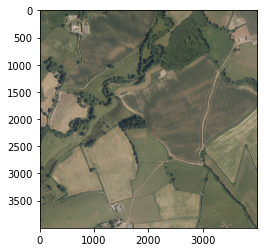

In [8]:
show(dataset.read([1,2,3]))

Show the corresponding binary image from Open Street map

In [9]:
solar_files=glob.glob(training_path+'solar-rasters/*.tif')

In [10]:
#Get the Ordnance survey grid ref for the first tile
tile=aerial_files[0].split('/')[-1].split('.tif')[0]
# Get the corresponding solar raster file
solar_tile=list(filter(lambda x: tile in x, solar_files))[0]

In [11]:
solar_dataset = rasterio.open(solar_tile)

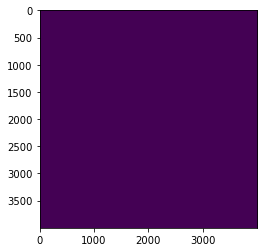

In [12]:
show(solar_dataset.read([1]))

There are no solar panels according to the raster in this file

In [13]:
list(map(lambda x: x.sum(), solar_dataset.read([1])>0))

[0]

Use [`skimage.measure.label`](https://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.label) to count number of separate panels in each, and count how many pixels registered as solar.

In [14]:
f=solar_files[671]
tmp=rasterio.open(f)
panels=measure.label(tmp.read([1])[0,:,:],background=0)

In [15]:
panels

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

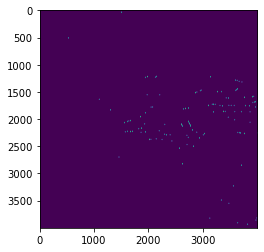

In [16]:
plt.imshow(tmp.read([1])[0,:,:])

I would like to make cutouts of all the panels, so need a way of getting centre positions of all the panels. Best way to do this is probably take median x and y co-ordinates of pixels taht correspond to each pixel.

In [17]:
x,y=np.meshgrid(range(0,panels.shape[0]),range(0,panels.shape[1]))

In [18]:
# get median position of panels
x_panel=[]
y_panel=[]
for i in range(1,panels.max()+1):
    ind=panels==i
    x_panel.append(np.median(x[ind]))
    y_panel.append(np.median(y[ind]))

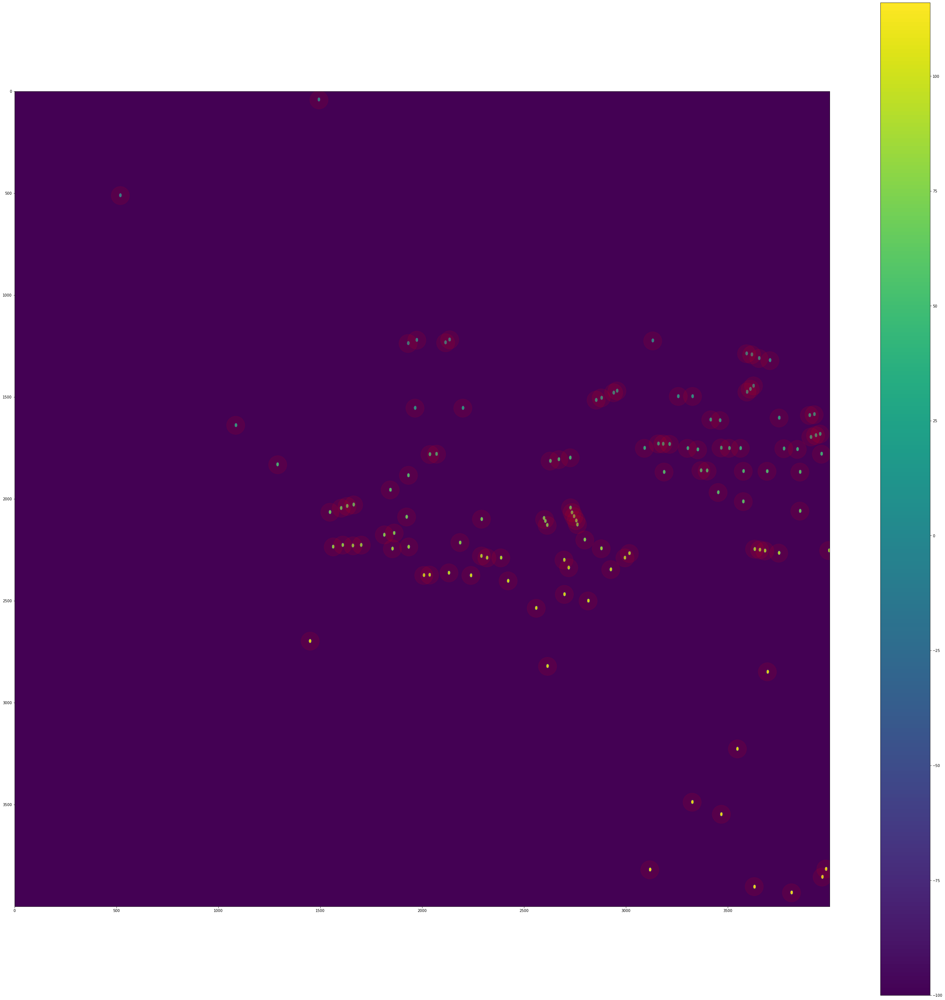

In [19]:
panels[panels==0]=-100
plt.figure(figsize=(50,50))
plt.imshow(panels)
plt.plot(x_panel,y_panel,'ro',alpha=0.1,ms=50)
plt.colorbar()

This approach seems to work so apply to all the files for Exeter

In [20]:
n_panels=[]
count = []
x_panel=[]
y_panel=[]
size=[]
tile=[]
min_x=[]
max_x=[]
min_y=[]
max_y=[]
ii=0
for f in solar_files:
    tmp=rasterio.open(f)
    panels=measure.label(tmp.read([1])[0,:,:],background=0)
    count.append(list(map(lambda x: x.sum(),tmp.read([1])>0)))
    n_panels.append(panels.max())
    
    for i in range(1,panels.max()+1):
        ind=panels==i
        x_panel.append(np.median(x[ind]))
        y_panel.append(np.median(y[ind]))
        min_x.append(np.min(x[ind]))
        max_x.append(np.max(x[ind]))
        min_y.append(np.min(y[ind]))
        max_y.append(np.max(y[ind]))
        tile.append(f.split('/')[-1].split('_')[0])
        size.append(ind.sum())

Create two `pandas` dataframe:
* A summary DataFrame with with counts (no. pixels), filename, Tile reference and number of panels
* A DataFrame with a row per panel with size, median co-ordinates and some boudning box co-ordinates

In [21]:
df=pd.DataFrame(
    np.asarray([np.asarray(count).flatten()
                ,solar_files
                ,[s.split('/')[-1].split('_')[0] for s in solar_files]
                ,np.asarray(n_panels).flatten()]).T,
    columns=['counts','filename','tile','no_panels'])

df_all=pd.DataFrame(np.asarray([np.asarray(tile).flatten(),
                    np.asarray(x_panel).flatten(),
                    np.asarray(y_panel).flatten(),
                    np.asarray(size).flatten(),
                               np.asarray(min_x).flatten(),
                               np.asarray(max_x).flatten(),
                               np.asarray(min_y).flatten(),
                               np.asarray(max_y).flatten()]).T,columns=['Tile','x','y','npix','min_x','max_x','min_y','max_y'])

In [22]:
df_all

,Tile,x,y,npix,min_x,max_x,min_y,max_y
0,SS7405,710.0,2747.0,499858,81,1330,2475,2994
1,SS7606,475.5,3283.5,186,470,481,3275,3292
2,SS7706,3966.0,289.0,16689,3928,3999,170,425
3,SS7806,610.0,395.0,449160,0,1071,170,727
4,SS8125,3601.0,1125.0,880486,3155,3999,492,1751
...,...,...,...,...,...,...,...,...
1442,SY0494,947.0,401.0,1304112,0,1709,0,1250
1443,SY0495,935.0,3865.0,399556,0,1541,3548,3999
1444,SY0592,196.0,232.0,193498,0,422,0,512
1445,SY0593,252.0,3363.0,651662,0,628,2657,3999


convert some of the columns to a more appropriate data type

In [23]:
df.counts=df.counts.astype(float)
df.no_panels=df.no_panels.astype(float)
df_all.x=df_all.x.astype(float)
df_all.y=df_all.y.astype(float)
df_all.npix=df_all.npix.astype(float)
df_all.min_x=df_all.min_x.astype(float)
df_all.min_y=df_all.min_y.astype(float)
df_all.max_x=df_all.max_x.astype(float)
df_all.max_y=df_all.max_y.astype(float)



In [24]:
print('%d out of %d files have solar from OSM' % (len(df[df.counts>0]),len(df)))
print('There are a total of %d panels' % df.no_panels.sum())

109 out of 2176 files have solar from OSM
There are a total of 1447 panels


In [25]:
def plot_raster_and_aerial(raster_file,aerial_file,alpha=0.2):
    """Plot aerial and solar binary next to each other"""
    dataset = rasterio.open(aerial_file)
    dataset_rast = rasterio.open(raster_file)

    fig, (ax_a,ax_c) = plt.subplots(1,2, figsize=(56,28))
    show(dataset.read([1,2,3]),ax=ax_a)
    #show(dataset_rast.read([1]),ax=ax_r)
    show(dataset.read([1,2,3]),ax=ax_c)
    show(dataset_rast.read([1]),ax=ax_c,alpha=alpha)

In [26]:
tile=df.loc[df.counts>0,'tile'].values[0]
aerial_tile=list(filter(lambda x: tile in x, aerial_files))[0]

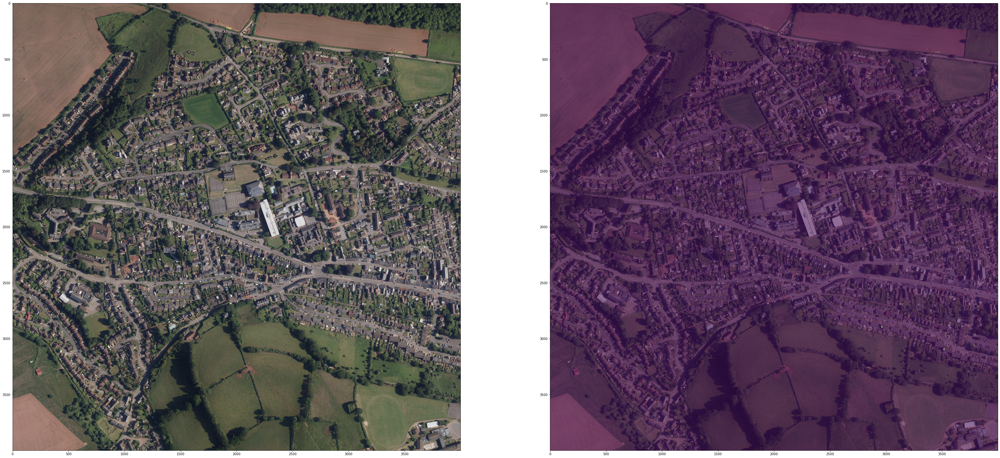

In [27]:
t=5
plot_raster_and_aerial(df.loc[df.counts>0,'filename'].values[t],
                       list(filter(lambda x: df.loc[df.counts>0,'tile'].values[t] in x, aerial_files))[0],alpha=0.5)

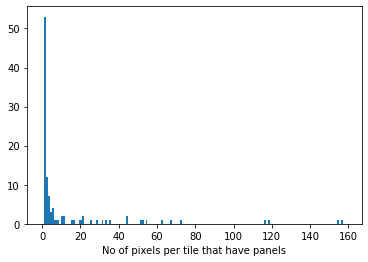

In [28]:
plt.hist(df[df.counts>0].no_panels,bins=np.arange(0,160,1));
plt.xlabel('No of pixels per tile that have panels');

Save the dataframes for later

In [29]:
df.to_csv('summary_dataframe_20210102.csv')
df_all.to_csv('OSM_panels_dataframe_20210102.csv')

## Make small tiffs
To use `labelme`, I need to create cutouts around each panel

In [30]:
from shapely.geometry import box, mapping
import geopandas as gpd
import fiona
from rasterio import transform
from fiona.crs import from_epsg
import pycrs
from rasterio.mask import mask

In [321]:
def getFeatures(gdf):
    """Function to parse features from GeoDataFrame in such a manner that rasterio wants them"""
    import json
    return [json.loads(gdf.to_json())['features'][0]['geometry']]


#how many pixels around from min and max do you want in cutouts
pad=200
#for every image
for i in range(0,len(df)):
    #if there are panels
    if df.loc[i,'no_panels']>0:
        #open image
        aerial_file=list(filter(lambda x: df.loc[i,'tile'] in x, aerial_files))[0]
        dataset = rasterio.open(aerial_file)

        #loop over very panel in the image
        for index, row in df_all.loc[df_all.Tile==df.loc[i,'tile']].iterrows():
            
            xmin=max(0,row['min_x']-pad)
            ymin=max(0,row['min_y']-pad)
            xmax=min(dataset.shape[0],row['max_x']+pad)
            ymax=min(dataset.shape[1],row['max_y']+pad)
            
            #create array for particualr panel
            xmin_np=int(max(0,row['min_x'])-xmin)
            ymin_np=int(max(0,row['min_y'])-ymin)
            xmax_np=int(min(dataset.shape[0],row['max_x'])-xmin)
            ymax_np=int(min(dataset.shape[1],row['max_y'])-ymin)
            
            
            
            rows=[xmin,xmax,row['x']]
            cols=[ymin,ymax,row['y']]
            xs,ys=transform.xy(dataset.transform,cols,rows)
            bbox = box(xs[0],ys[0],xs[1],ys[1])
            geo = gpd.GeoDataFrame({'geometry': bbox}, index=[0], crs=from_epsg(27700))
            geo = geo.to_crs(crs=dataset.crs.data)
            coords = getFeatures(geo)
            print(i, index)
            out_img, out_transform = mask(dataset, shapes=coords, crop=True)
            #crop solar raster file
            rast=np.empty_like(out_img[0,:,:]).astype(float)
            rast[:,:]=0.8
            rast[ymin_np:ymax_np,xmin_np:xmax_np]=1.2
            out_img=out_img*rast
            # Copy the metadata
            out_meta = dataset.meta.copy()

            # Parse EPSG code
            epsg_code = int(dataset.crs.data['init'][5:])

            out_meta.update({"driver": "GTiff",
                 "height": out_img.shape[1],
                 "width": out_img.shape[2],
                 "transform": out_transform,
                 "crs": pycrs.parse.from_epsg_code(epsg_code).to_proj4()})
            out_tif='/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/cutouts/{tile}_{latitude}_{longitude}.tif'.format(tile=row['Tile'],latitude=ys[2],longitude=xs[2])
            with rasterio.open(out_tif, "w", **out_meta) as dest:
                dest.write(out_img.astype(np.uint8))

129 0
172 1
195 2
219 3
320 4
325 5
325 6
350 7
350 8
357 9
357 10
357 11
357 12
357 13
357 14
357 15
357 16
357 17
357 18
357 19
534 20
536 21
555 22
627 23
627 24
627 25
627 26
627 27
627 28
627 29
627 30
627 31
627 32
627 33
627 34
627 35
627 36
627 37
627 38
627 39
627 40
627 41
627 42
627 43
627 44
627 45
627 46
627 47
627 48
627 49
627 50
627 51
627 52
627 53
627 54
627 55
627 56
627 57
627 58
627 59
627 60
627 61
627 62
627 63
627 64
627 65
627 66
627 67
627 68
627 69
627 70
627 71
627 72
627 73
628 74
628 75
628 76
628 77
628 78
628 79
628 80
628 81
628 82
628 83
628 84
628 85
628 86
628 87
628 88
628 89
628 90
628 91
628 92
628 93
628 94
628 95
628 96
628 97
628 98
628 99
628 100
628 101
628 102
628 103
628 104
628 105
628 106
628 107
628 108
628 109
628 110
628 111
628 112
628 113
628 114
628 115
628 116
628 117
648 118
648 119
648 120
648 121
648 122
648 123
648 124
648 125
648 126
648 127
648 128
648 129
648 130
648 131
648 132
648 133
648 134
648 135
648 136
648 137
648 13

1663 1015
1663 1016
1663 1017
1663 1018
1663 1019
1663 1020
1663 1021
1663 1022
1663 1023
1663 1024
1663 1025
1663 1026
1663 1027
1663 1028
1663 1029
1663 1030
1663 1031
1663 1032
1663 1033
1663 1034
1663 1035
1663 1036
1663 1037
1663 1038
1663 1039
1663 1040
1663 1041
1663 1042
1663 1043
1663 1044
1663 1045
1663 1046
1663 1047
1663 1048
1663 1049
1663 1050
1663 1051
1663 1052
1663 1053
1663 1054
1663 1055
1663 1056
1663 1057
1663 1058
1663 1059
1663 1060
1663 1061
1663 1062
1663 1063
1663 1064
1663 1065
1663 1066
1663 1067
1663 1068
1663 1069
1663 1070
1663 1071
1663 1072
1663 1073
1663 1074
1663 1075
1663 1076
1663 1077
1663 1078
1663 1079
1663 1080
1663 1081
1663 1082
1663 1083
1663 1084
1663 1085
1663 1086
1663 1087
1663 1088
1663 1089
1663 1090
1663 1091
1663 1092
1663 1093
1663 1094
1663 1095
1663 1096
1663 1097
1663 1098
1663 1099
1663 1100
1663 1101
1663 1102
1663 1103
1663 1104
1663 1105
1663 1106
1663 1107
1663 1108
1663 1109
1663 1110
1663 1111
1663 1112
1663 1113
1663 1114


## Read in polygons
I need to convert `json` files to `geojson` files

In [31]:
import json
from shapely.geometry import Polygon
import pandas as pd

In [32]:
polygons=glob.glob(training_path+'/polygons/*.json')

In [54]:
for p in range(0,len(polygons)):
    # for every json file
    
    # open json file
    with open(polygons[p]) as json_file:
        data = json.load(json_file)

    # get corresponding cutout
    dataset=rasterio.open(training_path+'/cutouts/'+'/'.join(data['imagePath'].split('/')[-2:]))
    geo=[]
    
    # for every point in json convert to National Grid coords
    for i,t in enumerate(data['shapes']):
        rows=[i[0] for i in t['points']]
        cols=[i[1] for i in t['points']]
        xs,ys=transform.xy(dataset.transform,cols,rows)
        try:
            polygon_geom = Polygon(zip(xs,ys))
            crs=from_epsg(27700)
            geo.append(gpd.GeoDataFrame(index=[0], crs=crs, geometry=[polygon_geom]))
        except (AttributeError, ValueError) as e:
            print(polygons[p])
    try:
        polygons_all=pd.concat(geo)
        #save as geojson
        polygons_all.to_file(filename=polygons[p].replace('json','geojson'), driver='GeoJSON')
    except (ValueError) as e:
        print('No polygons in file {}'.format(p))


No polygons in file 1351


## Create new solar raster files
* Open old raster files
* loop through each geojson
* save tiff as new solar raster tile

In [55]:
import shutil

In [56]:
geopolygons=glob.glob(training_path+'/polygons/*.geojson')

In [57]:
geopolygons

['/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS7405_105313.125_274177.625.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS7706_106927.625_277991.625.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS7806_106901.125_278152.625.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS8125_125718.625_281900.375.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS8200_100226.625_282879.125.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS8200_100276.125_282740.875.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS8225_125579.625_282347.375.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS8225_125697.625_282026.375.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS8300_100018.875_283075.625.geojson',
 '/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter

In [58]:
df

,counts,filename,tile,no_panels
0,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SS6605,0.0
1,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SS6606,0.0
2,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SS6702,0.0
3,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SS6703,0.0
4,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SS6704,0.0
...,...,...,...,...
2171,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SY2699,0.0
2172,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SY2797,0.0
2173,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SY2798,0.0
2174,0.0,/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw...,SY2799,0.0


In [81]:
for i in range(0,len(df)):
    if i % 0.1*len(df)==0:
        print(i,len(df))
    #if there are panels
    solar_file=list(filter(lambda x: df.loc[i,'tile'] in x, solar_files))[0]
    if df.loc[i,'no_panels']>0:
        #open image
        
        dataset = rasterio.open(solar_file)
        poly_in_tile=list(filter(lambda x: df.loc[i,'tile'] in x, geopolygons))
        #loop over all the geojsons for that tile
        if len(poly_in_tile) >0:
            out_image=np.zeros((1,4000,4000)).astype(np.uint8)
            for ii,p in enumerate(poly_in_tile):
                #create shapefile
                shapefile=gpd.read_file(p)
                geoms=shapefile.geometry.values
                try:
                    out_image_tmp, out_transform = mask(dataset, [mapping(g) for g in geoms], crop=False)
                except AttributeError:
                    print(solar_file,p)

                out_image[out_image_tmp[0,:,:][None,:,:]>0]=1.0
            # Copy the metadata
            out_meta = dataset.meta.copy()
            #print(i,solar_file,poly_in_tile,np.sum(out_image>0))

            # Parse EPSG code
            epsg_code = int(dataset.crs.data['init'][5:])
            out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform,
                 "count":1,
                 'nodata':0,
                 'compress':'lzw'})
            out_tif=training_path+'solar-rasters_v2/{}_solar_raster.tif'.format(df.loc[i,'tile'])

            with rasterio.open(out_tif, "w", **out_meta) as dest:
                dest.write(out_image.astype(rasterio.uint8))


0 2176
/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/solar-rasters/SS9612_solar_raster.tif /Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS9612_112989.625_296373.125.geojson
/Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter/solar-rasters/SS9712_solar_raster.tif /Volumes/pdh_storage_2/OCF/PV_Mapping/data/raw/Exeter//polygons/SS9712_112607.875_297034.875.geojson


In [76]:
d=rasterio.open(training_path+'solar-rasters_v3/SS7405_solar_raster.tif')

In [77]:
ind=d.read()>0

In [78]:
d.read(1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [79]:
ind.sum()

134492